In [1]:
import pandas as pd
from pmdarima import auto_arima
import numpy as np
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Leer datos

In [2]:
df = pd.read_csv('df_final_sin_outliers.csv')
df['datetime'] = pd.to_datetime(df['datetime'])
df.set_index('datetime', inplace=True)

In [3]:
so2 = df.copy()
so2 = so2[['SO2']]

# Calculo de gaps >50

In [4]:
is_nan = df['SO2'].isna()
gaps = []
i = 0
while i < len(is_nan):
    if is_nan[i]:
        start = i
        count = 0
        while i < len(is_nan) and is_nan[i]:
            count += 1
            i += 1
        # Guardar el valor del índice datetime de inicio y fin del gap
        gaps.append({
            'inicio_gap': df.index[start],
            'fin_gap': df.index[i-1],  # i-1 es el último índice nulo
            'longitud_gap': count
        })
    else:
        i += 1

# Crear el DataFrame de gaps
df_gaps = pd.DataFrame(gaps)
df_gaps_filt = df_gaps[df_gaps['longitud_gap'] > 50]  # Filtrar gaps mayores a 50 días
df_gaps_filt.head()

,inicio_gap,fin_gap,longitud_gap
0,2021-01-01 00:00:00,2021-03-03 23:00:00,1488
42,2021-03-24 10:00:00,2021-03-30 11:00:00,146
90,2021-05-25 11:00:00,2021-06-02 12:00:00,194
556,2022-07-25 10:00:00,2022-07-27 12:00:00,51
589,2022-12-15 23:00:00,2022-12-24 00:00:00,194


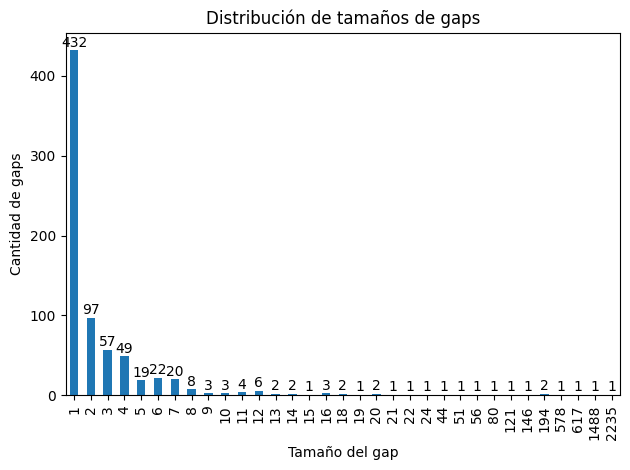

In [5]:
import pandas as pd
import matplotlib.pyplot as plt


conteo = df_gaps['longitud_gap'].value_counts().sort_index()

ax = conteo.plot(kind='bar')
plt.xlabel('Tamaño del gap')
plt.ylabel('Cantidad de gaps')
plt.title('Distribución de tamaños de gaps')

# Añadir los números encima de cada barra
for i, v in enumerate(conteo):
    plt.text(i, v + 0.5, str(v), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

In [6]:
import plotly.express as px

# Suponiendo que tu DataFrame se llama so2 y 'datetime' es el índice
temp = so2.reset_index()  # Si 'datetime' es el índice, lo pasamos a columna

fig = px.line(temp, x='datetime', y='SO2', title='Concentración de SO2 en el tiempo')
fig.show()

# Imputacion con interPolacion de gaps <= 9

In [7]:
import pandas as pd
import numpy as np

# Supón que tu DataFrame se llama df y la columna a imputar es 'valor'
col = 'SO2'

# Creamos una máscara para identificar los grupos de nulos consecutivos
is_na = so2[col].isna()
group = (is_na != is_na.shift()).cumsum()
group_sizes = is_na.groupby(group).transform('sum')

# Creamos una máscara para los nulos que están en grupos de hasta 20
mask = (is_na) & (group_sizes <= 9)

# Hacemos una copia para imputar solo donde corresponde
df_imputed = so2.copy()
# Interpolamos toda la columna
interpolated = so2[col].interpolate()

# Solo imputamos donde la máscara es True
df_imputed.loc[mask, col] = interpolated[mask]

# El resto de los nulos (grupos > 10) quedan igual

# Filtrar df original

In [8]:
df_imputed =  df_imputed.loc['2021-03-03 23:00:00':]

In [9]:
df_temp = df_imputed.copy()

# Filtrar fragemnto con menos gaps

In [10]:
so2_filt = df_imputed.loc['2021-06-02 12:00:00':'2022-12-15 23:00:00']

In [11]:
import plotly.express as px

# Suponiendo que tu DataFrame se llama so2 y 'datetime' es el índice
temp = so2_filt.reset_index()  # Si 'datetime' es el índice, lo pasamos a columna

fig = px.line(temp, x='datetime', y='SO2', title='Concentración de SO2 en el tiempo')
fig.show()

# Imputacion con Arima

## Funcion imputar con arima

In [12]:
def simula_arima_serie(serie, n_simular=1):

    modelo_auto = auto_arima(serie, seasonal=False, stepwise=True, suppress_warnings=True)
    p, d, q = modelo_auto.order
    ar_coefs = modelo_auto.arparams() if p > 0 else []
    ma_coefs = modelo_auto.maparams() if q > 0 else []
    serie_proc = pd.Series(serie)
    for _ in range(d):
        serie_proc = serie_proc.diff().dropna().reset_index(drop=True)
    errores = [0] * max(p, q)
    for t in range(max(p, q), len(serie_proc)):
        pred_ar = sum(ar_coefs[i] * serie_proc[t - i - 1] for i in range(p)) if p > 0 else 0
        pred_ma = sum(ma_coefs[i] * errores[t - i - 1] for i in range(q)) if q > 0 else 0
        predicho = pred_ar + pred_ma
        error = serie_proc[t] - predicho
        errores.append(error)
    errores = np.array(errores[max(p, q):])
    media = np.mean(errores)
    desvestandar = np.std(errores)
    SO2es_simulados = list(serie_proc[-max(p, q):])
    errores_simulados = list(errores[-max(p, q):])
    for _ in range(n_simular):
        pred_ar = sum(ar_coefs[i] * SO2es_simulados[-i-1] for i in range(p)) if p > 0 else 0
        pred_ma = sum(ma_coefs[i] * errores_simulados[-i-1] for i in range(q)) if q > 0 else 0
        predicho = pred_ar + pred_ma
        error_simulado = np.random.normal(loc=media, scale=desvestandar)
        nuevo_SO2 = predicho + error_simulado
   
        SO2es_simulados.append(nuevo_SO2)
        errores_simulados.append(error_simulado)
    nuevos = SO2es_simulados[-n_simular:]
    if d > 0:
        ultimos_original = serie[-d:]
        for i in range(d):
            nuevos = np.cumsum(np.concatenate(([ultimos_original[i]], nuevos)))[:-1]
    nuevos = [max(0, x) for x in nuevos]
    
    
    log = {
        'p': p,
        'd': d,
        'q': q,
        'ar_coefs': ar_coefs,
        'ma_coefs': ma_coefs,
        'media_error': media,
        'std_error': desvestandar,
        'n_simular': n_simular,
        'n_usados': len(serie)
    }
    return nuevos, log

## Generar fragmentos de datos observados y gaps

In [13]:
df_copia = so2_filt.copy()
is_nan = df_copia['SO2'].isna().values

# Encuentra los bloques de datos observados y los gaps
bloques = []
gaps = []
i = 0
N = len(df_copia)
while i < N:
    # Bloque observado
    if not is_nan[i]:
        start = i
        while i < N and not is_nan[i]:
            i += 1
        end = i  # no inclusivo
        bloques.append((start, end))
    # Gap
    if i < N and is_nan[i]:
        start = i
        while i < N and is_nan[i]:
            i += 1
        end = i  # no inclusivo
        gaps.append((start, end))

## Implementacion imputacion

In [14]:
logs_arima = []

for idx, (gap_start, gap_end) in enumerate(gaps):
    # Encuentra el bloque observado anterior
    bloque_anterior = None
    for b_start, b_end in bloques:
        if b_end == gap_start:
            bloque_anterior = (b_start, b_end)
            break
    if bloque_anterior is None:
        continue  # No hay bloque observado antes, no se puede simular

    # Toma los datos del bloque observado anterior
    serie_obs = df_copia['SO2'].iloc[bloque_anterior[0]:bloque_anterior[1]].values
    # Simula la cantidad de SO2es faltantes
    n_simular = gap_end - gap_start
    simulados, log = simula_arima_serie(serie_obs, n_simular=n_simular)
    
    log['gap_fecha_inicio'] = df_copia.index[gap_start]
    log['gap_fecha_fin'] = df_copia.index[gap_end - 1]
    logs_arima.append(log)
    # Rellena los SO2es simulados en el DataFrame
    df_copia.iloc[gap_start:gap_end, df_copia.columns.get_loc('SO2')] = simulados

# Al final, convierte los logs en un DataFrame
df_logs_arima = pd.DataFrame(logs_arima)

In [15]:
frag_limpio = df_copia.copy()

In [16]:
df_logs_arima.head()

,p,d,q,ar_coefs,ma_coefs,media_error,std_error,n_simular,n_usados,gap_fecha_inicio,gap_fecha_fin
0,4,0,0,"[0.8363579023467057, -0.07504687168070724, 0.0...",[],4.076358,5.685613,24,890,2021-07-10 13:00:00,2021-07-11 12:00:00
1,1,0,1,[0.7883168294925244],[0.1887788936552013],2.255634,5.527502,16,213,2021-07-20 18:00:00,2021-07-21 09:00:00
2,2,0,0,"[1.008238729450951, -0.22364986538905876]",[],2.774797,4.832656,15,959,2021-08-30 22:00:00,2021-08-31 12:00:00
3,1,0,1,[0.7146506360114394],[0.19654910582941645],3.315656,5.024381,19,418,2021-09-18 00:00:00,2021-09-18 18:00:00
4,1,0,1,[0.5693430530006336],[0.36094507457856834],3.729285,5.768083,13,101,2021-09-23 01:00:00,2021-09-23 13:00:00


In [17]:
import plotly.graph_objects as go
import numpy as np

# Suponiendo que df es tu DataFrame original y frag_limpio es el imputado
imputados_mask = so2_filt['SO2'].isna() & frag_limpio['SO2'].notna()

# Serie de imputados: NaN en todos lados excepto en los imputados
imputados_plot = np.full_like(frag_limpio['SO2'], np.nan, dtype=np.float64)
imputados_plot[imputados_mask] = frag_limpio['SO2'][imputados_mask]

fig = go.Figure()

# Serie original
fig.add_trace(go.Scatter(
    x=so2_filt.index,
    y=so2_filt['SO2'],
    mode='lines',
    name='Original',
    line=dict(color='blue', width=2)
))

# Imputados como puntos
fig.add_trace(go.Scatter(
    x=frag_limpio.index,
    y=imputados_plot,
    mode='lines',
    name='Imputados',
    line=dict(color='red',width=2)
))

fig.update_layout(
    title='Serie original y valores imputados',
    xaxis_title='Índice',
    yaxis_title='SO2',
    legend=dict(x=0.01, y=0.99)
)

fig.show()

# Simular con los parametros del fragemnto limpio

In [18]:
df_impt_p1 = df_imputed.loc[:'2023-03-17 23:00:00']

In [19]:

def simula_arima_serie_param(serie, n_simular, p, d, q, ar_coefs, ma_coefs):
    serie_proc = pd.Series(serie)
    for _ in range(d):
        serie_proc = serie_proc.diff().dropna().reset_index(drop=True)
    errores = [0] * max(p, q)
    for t in range(max(p, q), len(serie_proc)):
        pred_ar = sum(ar_coefs[i] * serie_proc[t - i - 1] for i in range(p)) if p > 0 else 0
        pred_ma = sum(ma_coefs[i] * errores[t - i - 1] for i in range(q)) if q > 0 else 0
        predicho = pred_ar + pred_ma
        error = serie_proc[t] - predicho
        errores.append(error)

    errores = np.array(errores[max(p, q):])
    media_error = np.mean(errores)
    std_error = np.std(errores)
    
    SO2es_simulados = list(serie_proc[-max(p, q):])
    errores_simulados = list(errores[-max(p, q):])
    
    # Rellenar si faltan elementos
    while len(errores_simulados) < q:
        errores_simulados.insert(0, 0)
    while len(SO2es_simulados) < p:
        SO2es_simulados.insert(0, 0)
    
    
    for _ in range(n_simular):
        pred_ar = sum(ar_coefs[i] * SO2es_simulados[-i-1] for i in range(p)) if p > 0 else 0
        pred_ma = sum(ma_coefs[i] * errores_simulados[-i-1] for i in range(q)) if q > 0 else 0
        predicho = pred_ar + pred_ma
        error_simulado = np.random.normal(loc=media_error, scale=std_error)
        nuevo_SO2 = predicho + error_simulado
        SO2es_simulados.append(nuevo_SO2)
        errores_simulados.append(error_simulado)
    nuevos = SO2es_simulados[-n_simular:]
    if d > 0:
        ultimos_original = serie[-d:]
        for i in range(d):
            nuevos = np.cumsum(np.concatenate(([ultimos_original[i]], nuevos)))[:-1]
    nuevos = [max(0, x) for x in nuevos]
    return nuevos

In [20]:
modelo_auto = auto_arima(frag_limpio.dropna(), seasonal=False, stepwise=True, suppress_warnings=True)
p, d, q = modelo_auto.order
ar_coefs = modelo_auto.arparams() if p > 0 else []
ma_coefs = modelo_auto.maparams() if q > 0 else []

In [21]:
p,d,q

(0, 1, 5)

In [22]:
ar_coefs, ma_coefs

([], array([-0.04996156, -0.23636345, -0.25339466, -0.22970508, -0.18950833]))

In [23]:
df_copia = df_impt_p1.copy()
is_nan = df_copia['SO2'].isna().values

# Encuentra los bloques de datos observados y los gaps
bloques = []
gaps = []
i = 0
N = len(df_copia)
while i < N:
    # Bloque observado
    if not is_nan[i]:
        start = i
        while i < N and not is_nan[i]:
            i += 1
        end = i  # no inclusivo
        bloques.append((start, end))
    # Gap
    if i < N and is_nan[i]:
        start = i
        while i < N and is_nan[i]:
            i += 1
        end = i  # no inclusivo
        gaps.append((start, end))

In [24]:
logs_arima = []

for idx, (gap_start, gap_end) in enumerate(gaps):
    # Encuentra el bloque observado anterior
    bloque_anterior = None
    for b_start, b_end in bloques:
        if b_end == gap_start:
            bloque_anterior = (b_start, b_end)
            break
    if bloque_anterior is None:
        continue  # No hay bloque observado antes, no se puede simular

    # Toma los datos del bloque observado anterior
    serie_obs = df_copia['SO2'].iloc[bloque_anterior[0]:bloque_anterior[1]].values
    # Simula la cantidad de SO2es faltantes
    n_simular = gap_end - gap_start
    simulados = simula_arima_serie_param(serie_obs, n_simular,p, d, q, ar_coefs, ma_coefs)
    
    log['gap_fecha_inicio'] = df_copia.index[gap_start]
    log['gap_fecha_fin'] = df_copia.index[gap_end - 1]
    logs_arima.append(log)
    # Rellena los SO2es simulados en el DataFrame
    df_copia.iloc[gap_start:gap_end, df_copia.columns.get_loc('SO2')] = simulados

# Al final, convierte los logs en un DataFrame
df_logs_arima = pd.DataFrame(logs_arima)

In [25]:
import plotly.graph_objects as go
import numpy as np

# Suponiendo que df es tu DataFrame original y df_copia es el imputado
imputados_mask = df_impt_p1['SO2'].isna() & df_copia['SO2'].notna()

# Serie de imputados: NaN en todos lados excepto en los imputados
imputados_plot = np.full_like(df_copia['SO2'], np.nan, dtype=np.float64)
imputados_plot[imputados_mask] = df_copia['SO2'][imputados_mask]

fig = go.Figure()

# Serie original
fig.add_trace(go.Scatter(
    x=df_impt_p1.index,
    y=df_impt_p1['SO2'],
    mode='lines',
    name='Original',
    line=dict(color='blue', width=2)
))

# Imputados como puntos
fig.add_trace(go.Scatter(
    x=df_copia.index,
    y=imputados_plot,
    mode='lines',
    name='Imputados',
    line=dict(color='red',width=2)
))

fig.update_layout(
    title='Serie original y valores imputados',
    xaxis_title='Índice',
    yaxis_title='SO2',
    legend=dict(x=0.01, y=0.99)
)

fig.show()

## Actualizar df imptp1

In [26]:
df_impt_p1.update(df_copia)

In [27]:
import numpy as np
import pandas as pd

df2 = df_impt_p1.copy()

total_a_imputar = 2235
paso = 200

serie = df_impt_p1['SO2'].dropna().values
imputados = []

# Imputar en bloques de 'paso', y el último bloque puede ser menor
n_iter = total_a_imputar // paso
resto = total_a_imputar % paso

for _ in range(n_iter):
    nuevos = simula_arima_serie_param(serie, paso, p, d, q, ar_coefs, ma_coefs)
    imputados.extend(nuevos)
    serie = np.concatenate([serie, nuevos])

if resto > 0:
    nuevos = simula_arima_serie_param(serie, resto, p, d, q, ar_coefs, ma_coefs)
    imputados.extend(nuevos)
    serie = np.concatenate([serie, nuevos])

# Ahora imputados debe tener exactamente total_a_imputar elementos
assert len(imputados) == total_a_imputar

# Índice horario para los imputados
ultima_fecha = df_impt_p1.index[-1]
fechas_imputadas = pd.date_range(ultima_fecha + pd.Timedelta(hours=1), periods=total_a_imputar, freq='H')

# DataFrame de imputados
df_imputados = pd.DataFrame({'SO2': imputados}, index=fechas_imputadas)
df_extendido = pd.concat([df_impt_p1, df_imputados])

In [28]:
import plotly.graph_objects as go

# Máscara: True solo para los imputados (las fechas nuevas)
imputados_mask = df_extendido.index.isin(df_imputados.index)

# Serie de imputados: NaN en todos lados excepto en los imputados
imputados_plot = np.full_like(df_extendido['SO2'], np.nan, dtype=np.float64)
imputados_plot[imputados_mask] = df_extendido['SO2'][imputados_mask]

fig = go.Figure()

# Serie original (azul)
fig.add_trace(go.Scatter(
    x=df_extendido.index,
    y=df_extendido['SO2'],
    mode='lines',
    name='Original',
    line=dict(color='blue', width=2)
))

# Imputados (rojo)
fig.add_trace(go.Scatter(
    x=df_extendido.index,
    y=imputados_plot,
    mode='lines',
    name='Imputados',
    line=dict(color='red', width=2)
))

fig.update_layout(
    title='Serie original y valores imputados (futuros)',
    xaxis_title='Fecha',
    yaxis_title='SO2',
    legend=dict(x=0.01, y=0.99)
)

fig.show()

In [29]:
df_extendido.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 19883 entries, 2021-03-03 23:00:00 to 2023-06-19 02:00:00
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SO2     19882 non-null  float64
dtypes: float64(1)
memory usage: 310.7 KB


## Imputacion final

In [30]:
df_imputed.update(df_extendido)

In [31]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 30409 entries, 2021-03-03 23:00:00 to 2024-09-01 00:00:00
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SO2     29090 non-null  float64
dtypes: float64(1)
memory usage: 1.5 MB


In [32]:
df_copia = df_imputed.copy()
is_nan = df_copia['SO2'].isna().values

# Encuentra los bloques de datos observados y los gaps
bloques = []
gaps = []
i = 0
N = len(df_copia)
while i < N:
    # Bloque observado
    if not is_nan[i]:
        start = i
        while i < N and not is_nan[i]:
            i += 1
        end = i  # no inclusivo
        bloques.append((start, end))
    # Gap
    if i < N and is_nan[i]:
        start = i
        while i < N and is_nan[i]:
            i += 1
        end = i  # no inclusivo
        gaps.append((start, end))  # <--- ¡ESTA LÍNEA FALTABA!

logs_arima = []

for idx, (gap_start, gap_end) in enumerate(gaps):
    # Encuentra el bloque observado anterior
    bloque_anterior = None
    for b_start, b_end in bloques:
        if b_end == gap_start:
            bloque_anterior = (b_start, b_end)
            break
    if bloque_anterior is None:
        continue  # No hay bloque observado antes, no se puede simular

    # Toma los datos del bloque observado anterior
    serie_obs = df_copia['SO2'].iloc[bloque_anterior[0]:bloque_anterior[1]].values
    # Simula la cantidad de SO2es faltantes
    n_simular = gap_end - gap_start
    simulados = simula_arima_serie_param(serie_obs, n_simular, p, d, q, ar_coefs, ma_coefs)
    
    log = {}
    log['gap_fecha_inicio'] = df_copia.index[gap_start]
    log['gap_fecha_fin'] = df_copia.index[gap_end - 1]
    logs_arima.append(log)
    # Rellena los SO2es simulados en el DataFrame
    df_copia.iloc[gap_start:gap_end, df_copia.columns.get_loc('SO2')] = simulados

# Al final, convierte los logs en un DataFrame
df_logs_arima = pd.DataFrame(logs_arima)

c:\Maestria\Trabajo de grado\repositorio\.venv\lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning:

Mean of empty slice.

c:\Maestria\Trabajo de grado\repositorio\.venv\lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning:

invalid value encountered in scalar divide

c:\Maestria\Trabajo de grado\repositorio\.venv\lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning:

Degrees of freedom <= 0 for slice

c:\Maestria\Trabajo de grado\repositorio\.venv\lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning:

invalid value encountered in divide

c:\Maestria\Trabajo de grado\repositorio\.venv\lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning:

invalid value encountered in scalar divide



In [33]:
df_imputed

,SO2
datetime,
2021-03-03 23:00:00,NaN
2021-03-04 00:00:00,22.695646
2021-03-04 01:00:00,23.594697
2021-03-04 02:00:00,16.030704
2021-03-04 03:00:00,14.645217
...,...
2024-08-31 20:00:00,4.475329
2024-08-31 21:00:00,3.652872
2024-08-31 22:00:00,3.288098


In [34]:
df_copia.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 30409 entries, 2021-03-03 23:00:00 to 2024-09-01 00:00:00
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SO2     30408 non-null  float64
dtypes: float64(1)
memory usage: 1.5 MB


In [35]:
import numpy as np
import pandas as pd


df_copia = df_imputed.copy()
is_nan = df_copia['SO2'].isna().values

# Encuentra los bloques de datos observados y los gaps
bloques = []
gaps = []
i = 0
N = len(df_copia)
while i < N:
    # Bloque observado
    if not is_nan[i]:
        start = i
        while i < N and not is_nan[i]:
            i += 1
        end = i  # no inclusivo
        bloques.append((start, end))
    # Gap
    if i < N and is_nan[i]:
        start = i
        while i < N and is_nan[i]:
            i += 1
        end = i  # no inclusivo
        gaps.append((start, end))

logs_arima = []
paso = 50  # tamaño máximo de cada bloque de imputación

for idx, (gap_start, gap_end) in enumerate(gaps):
    gap_len = gap_end - gap_start
    imputados_gap = []

    n_iter = gap_len // paso
    resto = gap_len % paso
    pos = gap_start

    for _ in range(n_iter):
        serie_obs = df_copia['SO2'].iloc[:pos].dropna().values
        if len(serie_obs) < d:
            print(f"Saltando bloque en {df_copia.index[pos]} porque no hay suficientes datos previos")
            break
        simulados = simula_arima_serie_param(serie_obs, paso, p, d, q, ar_coefs, ma_coefs)
        imputados_gap.extend(simulados)
        df_copia.iloc[pos:pos+paso, df_copia.columns.get_loc('SO2')] = simulados
        pos += paso

    if resto > 0:
        serie_obs = df_copia['SO2'].iloc[:pos].dropna().values
        if len(serie_obs) < d:
            print(f"Saltando bloque final en {df_copia.index[pos]} porque no hay suficientes datos previos")
            continue
        simulados = simula_arima_serie_param(serie_obs, resto, p, d, q, ar_coefs, ma_coefs)
        imputados_gap.extend(simulados)
        df_copia.iloc[pos:pos+resto, df_copia.columns.get_loc('SO2')] = simulados

    # Log para auditoría
    log = {}
    log['gap_fecha_inicio'] = df_copia.index[gap_start]
    log['gap_fecha_fin'] = df_copia.index[gap_end - 1]
    log['gap_len'] = gap_len
    logs_arima.append(log)

df_logs_arima = pd.DataFrame(logs_arima)

Saltando bloque final en 2021-03-03 23:00:00 porque no hay suficientes datos previos


In [36]:
import plotly.graph_objects as go
import numpy as np

imputados_mask = df_imputed['SO2'].isna() & df_copia['SO2'].notna()

# Serie de imputados: NaN en todos lados excepto en los imputados
imputados_plot = np.full_like(df_copia['SO2'], np.nan, dtype=np.float64)
imputados_plot[imputados_mask] = df_copia['SO2'][imputados_mask]

fig = go.Figure()

# Serie original
fig.add_trace(go.Scatter(
    x=df_imputed.index,
    y=df_imputed['SO2'],
    mode='lines',
    name='Original',
    line=dict(color='blue', width=2)
))

# Imputados como puntos
fig.add_trace(go.Scatter(
    x=df_copia.index,
    y=imputados_plot,
    mode='lines',
    name='Imputados',
    line=dict(color='red',width=2)
))

fig.update_layout(
    title='Serie original y valores imputados',
    xaxis_title='Índice',
    yaxis_title='SO2',
    legend=dict(x=0.01, y=0.99)
)

fig.show()

# Df final ahora si este es

In [37]:
df_final = df_copia.copy()

In [38]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 30409 entries, 2021-03-03 23:00:00 to 2024-09-01 00:00:00
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   SO2     30408 non-null  float64
dtypes: float64(1)
memory usage: 1.5 MB


In [39]:
import plotly.express as px

# Suponiendo que df_final ya tiene el DatetimeIndex y la columna SO2
fig = px.line(df_final, y='SO2', title='Concentración de SO2 a lo largo del tiempo')
fig.update_layout(xaxis_title='Fecha', yaxis_title='SO2')
fig.show()

In [40]:
import plotly.graph_objects as go
import numpy as np

imputados_mask = df_temp['SO2'].isna() & df_final['SO2'].notna()

# Serie de imputados: NaN en todos lados excepto en los imputados
imputados_plot = np.full_like(df_final['SO2'], np.nan, dtype=np.float64)
imputados_plot[imputados_mask] = df_final['SO2'][imputados_mask]

fig = go.Figure()

# Serie original
fig.add_trace(go.Scatter(
    x=df_temp.index,
    y=df_temp['SO2'],
    mode='lines',
    name='Original',
    line=dict(color='blue', width=2)
))

# Imputados como puntos
fig.add_trace(go.Scatter(
    x=df_final.index,
    y=imputados_plot,
    mode='lines',
    name='Imputados',
    line=dict(color='red',width=2)
))

fig.update_layout(
    title='Serie original y valores imputados',
    xaxis_title='Índice',
    yaxis_title='SO2',
    legend=dict(x=0.01, y=0.99)
)

fig.show()

In [41]:
#guardar en csv
df_final.to_csv('imputadoS2O.csv')